<a href="https://colab.research.google.com/github/JVR27XD/SAM/blob/main/NanoSAM/NanoSAM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np, sklearn, cv2, onnxruntime as ort
print("NumPy", np.__version__, "| sklearn", sklearn.__version__, "| OpenCV", cv2.__version__, "| ORT", ort.__version__)


NumPy 1.26.4 | sklearn 1.4.2 | OpenCV 4.8.1 | ORT 1.17.3


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Clonar NanoSAM
import os
if not os.path.exists("/content/nanosam"):
    !git clone https://github.com/NVIDIA-AI-IOT/nanosam.git /content/nanosam
%cd /content/nanosam

# Arreglar import/rutas en Colab
import sys, os, shutil, importlib, pathlib

repo_dir = "/content/nanosam"
pkg_dir  = "/content/nanosam"

# 1) Asegura que la ruta del repo está al principio del PYTHONPATH
if pkg_dir not in sys.path:
    sys.path.insert(0, pkg_dir)

# 2) Limpia posibles cachés que confundan el import
for d in [
    os.path.join(repo_dir, "__pycache__"),
    os.path.join(repo_dir, "nanosam", "__pycache__")
]:
    if os.path.isdir(d):
        shutil.rmtree(d, ignore_errors=True)


# 4) Comprobaciones básicas de estructura
print("Contenido de /content/nanosam:", [p.name for p in pathlib.Path(repo_dir).iterdir()])
print("¿Existe carpeta 'nanosam'? ->", os.path.isdir(os.path.join(repo_dir, "nanosam")))

# 5) Dependencias mínimas y compatibles (sin TensorRT)
#    Usamos NumPy 1.26 + OpenCV estable + ONNX Runtime
!pip -q uninstall -y opencv-python opencv-python-headless opencv-contrib-python >/dev/null
!pip -q install "numpy==1.26.4" "opencv-python==4.8.1.78" "onnxruntime==1.17.3" pillow matplotlib

# 6) "Cargar el modelo" (equivalente): preparar sesiones ONNX (encoder + decoder)
#    En NanoSAM el "modelo" para inferencia son dos ONNX: encoder y decoder
import onnxruntime as ort

data_dir = "/content/drive/MyDrive/Colab Notebooks/TFG/NanoSam"
os.makedirs(data_dir, exist_ok=True)

ENCODER_ONNX = os.path.join(data_dir, "resnet18_image_encoder.onnx")
DECODER_ONNX = os.path.join(data_dir, "mobile_sam_mask_decoder.onnx")

assert os.path.exists(ENCODER_ONNX), f"❌ Falta el encoder ONNX en {ENCODER_ONNX}. Colócalo ahí."
assert os.path.exists(DECODER_ONNX), f"❌ Falta el decoder ONNX en {DECODER_ONNX}. Colócalo ahí."

providers = ["CPUExecutionProvider"]

enc_sess = ort.InferenceSession(ENCODER_ONNX, providers=providers)
dec_sess = ort.InferenceSession(DECODER_ONNX, providers=providers)

def print_io(session, title):
    print(f"\n=== {title} ===")
    for i, t in enumerate(session.get_inputs()):
        print(f"IN[{i}] name={t.name} shape={t.shape} type={t.type}")
    for i, t in enumerate(session.get_outputs()):
        print(f"OUT[{i}] name={t.name} shape={t.shape} type={t.type}")

print_io(enc_sess, "Encoder ONNX")
print_io(dec_sess, "Decoder ONNX")
print("✅ Sesiones ONNX inicializadas (NanoSAM sin TensorRT). Listo para inferencia con puntos.")

device = "cpu"
print("Device simulado (ORT):", device)


/content/nanosam
Contenido de /content/nanosam: ['docker', 'assets', 'examples', 'README.md', 'setup.py', 'nanosam', '.gitignore', 'LICENSE.md', '.git']
¿Existe carpeta 'nanosam'? -> True

=== Encoder ONNX ===
IN[0] name=image shape=[1, 3, 1024, 1024] type=tensor(float)
OUT[0] name=image_embeddings shape=[1, 256, 64, 64] type=tensor(float)

=== Decoder ONNX ===
IN[0] name=image_embeddings shape=[1, 256, 64, 64] type=tensor(float)
IN[1] name=point_coords shape=[1, 'num_points', 2] type=tensor(float)
IN[2] name=point_labels shape=[1, 'num_points'] type=tensor(float)
IN[3] name=mask_input shape=[1, 1, 256, 256] type=tensor(float)
IN[4] name=has_mask_input shape=[1] type=tensor(float)
OUT[0] name=iou_predictions shape=['Gemmiou_predictions_dim_0', 4] type=tensor(float)
OUT[1] name=low_res_masks shape=['Reshapelow_res_masks_dim_0', 'Reshapelow_res_masks_dim_1', 'Reshapelow_res_masks_dim_2', 'Reshapelow_res_masks_dim_3'] type=tensor(float)
✅ Sesiones ONNX inicializadas (NanoSAM sin TensorRT)

In [ ]:
# Rutas de proyecto
base_dir = "/content/drive/MyDrive/Colab Notebooks/SolDef_AI"
labeled_dir = os.path.join(base_dir, "Labeled")
mask_output_dir = os.path.join(labeled_dir, "generated_masks")
os.makedirs(mask_output_dir, exist_ok=True)

print("📂 Base:", base_dir)
print("📂 Labeled:", labeled_dir)
print("📂 Masks out:", mask_output_dir)

📂 Base: /content/drive/MyDrive/Colab Notebooks/SolDef_AI
📂 Labeled: /content/drive/MyDrive/Colab Notebooks/SolDef_AI/Labeled
📂 Masks out: /content/drive/MyDrive/Colab Notebooks/SolDef_AI/Labeled/generated_masks


In [ ]:
import json
import numpy as np
from PIL import Image, ImageDraw

def scale_polygon(points, original_width, original_height, target_width, target_height):
    """Reescala puntos del espacio (ann_w, ann_h) al espacio (img_w, img_h)."""
    sx = target_width / float(original_width)  if original_width  else 1.0
    sy = target_height / float(original_height) if original_height else 1.0
    return [(x * sx, y * sy) for (x, y) in points]

def clamp_points(points, W, H):
    return [
        (int(max(0, min(W - 1, x))),
         int(max(0, min(H - 1, y))))
        for x, y in points
    ]

#  Explorar JSONs, generar máscaras 0/255 y construir listas alineadas
image_paths, mask_paths = [], []
json_files = sorted(f for f in os.listdir(labeled_dir) if f.endswith(".json"))

skipped = 0
for jf in json_files:
    jp = os.path.join(labeled_dir, jf)
    with open(jp, "r") as f:
        data = json.load(f)

    image_name = data.get("imagePath")
    if not image_name:
        skipped += 1
        continue

    ipath = os.path.join(labeled_dir, image_name)
    if not os.path.exists(ipath):
        print(f"⚠️ Imagen no encontrada para {jf}: {image_name}")
        skipped += 1
        continue

    img = Image.open(ipath).convert("RGB")
    W, H = img.size

    ann_w = data.get("imageWidth", W)
    ann_h = data.get("imageHeight", H)

    # Crear máscara 0/255
    mask = Image.new("L", (W, H), 0)
    draw = ImageDraw.Draw(mask)

    for shape in data.get("shapes", []):
        pts = shape.get("points", [])
        if not pts:
            continue

        scaled = scale_polygon(pts, ann_w, ann_h, W, H)
        scaled = clamp_points(scaled, W, H)
        draw.polygon(scaled, outline=255, fill=255)

    mname = os.path.splitext(image_name)[0] + "_mask.png"
    mpath = os.path.join(mask_output_dir, mname)
    mask.save(mpath)

    image_paths.append(ipath)
    mask_paths.append(mpath)

print(f"✅ Máscaras generadas: {len(mask_paths)} | JSONs omitidos: {skipped}")
assert len(image_paths) == len(mask_paths) and len(image_paths) > 0, "No hay pares imagen-máscara válidos."


✅ Máscaras generadas: 428 | JSONs omitidos: 0


Este bloque prepara el dataset de imágenes/máscaras para ser usado en inferencia con NanoSAM-ONNX. Primero carga los datos en formato RAW (PIL), luego define un DataLoader para recorrerlos, y finalmente aplica el preprocesamiento

In [ ]:
#  Dataset RAW (PIL) para NanoSAM-ONNX
from torch.utils.data import Dataset, DataLoader
from PIL import Image as PILImage

class PCBDefectDatasetRaw(Dataset):
    def __init__(self, image_paths, mask_paths):
        assert len(image_paths) == len(mask_paths)
        self.image_paths = image_paths
        self.mask_paths = mask_paths
    def __len__(self):
        return len(self.image_paths)
    def __getitem__(self, idx):
        img = PILImage.open(self.image_paths[idx]).convert("RGB")
        msk = PILImage.open(self.mask_paths[idx]).convert("L")
        return img, msk, self.image_paths[idx]

# DataLoader sin workers ni pin_memory (estamos en ORT/CPU o ORT/CUDA, no en PyTorch GPU)
eval_loader = DataLoader(
    PCBDefectDatasetRaw(image_paths, mask_paths),
    batch_size=1,
    shuffle=False,
    num_workers=0,
    pin_memory=False,
    collate_fn=lambda x: x
)

# Chequeo rápido
batch = next(iter(eval_loader))
image_pil, mask_pil, pth = batch[0]
print("Imagen:", type(image_pil), image_pil.size, "Máscara:", type(mask_pil), mask_pil.size, "Ruta:", pth)



Imagen: <class 'PIL.Image.Image'> (2560, 1440) Máscara: <class 'PIL.Image.Image'> (2560, 1440) Ruta: /content/drive/MyDrive/Colab Notebooks/SolDef_AI/Labeled/WIN_20220329_14_30_32_Pro.jpg


In [ ]:
# Limpia paquetes que rompen compatibilidad
!pip uninstall -y numpy scipy scikit-learn numba cuml-cu12 umap-learn spacy thinc

# Instala la pila estable para tu proyecto (compatible con ONNXRuntime y OpenCV que usamos)
!pip install -q numpy==1.26.4 scipy==1.11.4 scikit-learn==1.4.2 onnxruntime==1.17.3 opencv-python==4.8.1.78


Found existing installation: numpy 1.26.4
Uninstalling numpy-1.26.4:
  Successfully uninstalled numpy-1.26.4
Found existing installation: scipy 1.11.4
Uninstalling scipy-1.11.4:
  Successfully uninstalled scipy-1.11.4
Found existing installation: scikit-learn 1.4.2
Uninstalling scikit-learn-1.4.2:
  Successfully uninstalled scikit-learn-1.4.2
Found existing installation: numba 0.60.0
Uninstalling numba-0.60.0:
  Successfully uninstalled numba-0.60.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
librosa 0.11.0 requires numba>=0.51.0, which is not installed.
cudf-cu12 25.6.0 requires numba<0.62.0a0,>=0.59.1, which is not installed.
pynndescent 0.5.13 requires numba>=0.51.2, which is not installed.
stumpy 1.13.0 requires numba>=0.57.1, which is not installed.
fastai 2.7.19 requires spacy<4, which is not installed.
shap 0.48.0 requires numba>=0.54, which is not i

In [ ]:
import numpy as np, sklearn, cv2, onnxruntime as ort
from sklearn.metrics import jaccard_score, precision_score, recall_score
print("NumPy", np.__version__, "| sklearn", sklearn.__version__, "| OpenCV", cv2.__version__, "| ORT", ort.__version__)


NumPy 1.26.4 | sklearn 1.4.2 | OpenCV 4.8.1 | ORT 1.17.3


In [ ]:
import numpy as np
from sklearn.metrics import jaccard_score, precision_score, recall_score

def dice_coef_np(y_true, y_pred):
    """
    Calcula el coeficiente Dice entre dos máscaras binarias.
    y_true, y_pred: arrays binarios (0/1) o booleanos de misma forma.
    """
    y_true = np.asarray(y_true).astype(np.uint8).flatten()
    y_pred = np.asarray(y_pred).astype(np.uint8).flatten()
    inter = np.sum(y_true * y_pred)
    return (2.0 * inter) / (np.sum(y_true) + np.sum(y_pred) + 1e-7)


In [ ]:
from PIL import Image as PILImage
import numpy as np
import onnxruntime as ort

TARGET = 1024
IMAGENET_MEAN = np.array([0.485, 0.456, 0.406], dtype=np.float32)
IMAGENET_STD  = np.array([0.229, 0.224, 0.225], dtype=np.float32)

def preprocess_to_1024(image_pil, mask_pil):
    # Imagen -> [0,1] -> normalización ImageNet -> (1,3,1024,1024) float32
    img_res = image_pil.resize((TARGET, TARGET), PILImage.BILINEAR)
    arr = np.asarray(img_res).astype(np.float32) / 255.0
    arr = (arr - IMAGENET_MEAN) / IMAGENET_STD
    input_tensor = np.transpose(arr, (2,0,1))[None, ...].astype(np.float32)
    # GT -> binaria 0/1, redimensionada con NEAREST
    gt_1024 = (np.array(mask_pil.resize((TARGET, TARGET), PILImage.NEAREST)) > 127).astype(np.uint8)
    return input_tensor, gt_1024

def encode_image_onnx(enc_sess, input_tensor):
    in_name = enc_sess.get_inputs()[0].name
    out_name = enc_sess.get_outputs()[0].name
    emb = enc_sess.run([out_name], {in_name: input_tensor})[0]
    return emb.astype(np.float32)



In [ ]:
# Helpers para DECODER de NanoSAM (ONNX)
import numpy as np
import cv2

NORMALIZE_POINTS = False
TARGET = 1024  # debe coincidir con tu preprocess_to_1024

def run_decoder_points(dec_sess, embeddings, pts_1024):
    """
    dec_sess: onnxruntime.InferenceSession del decoder
    embeddings: (1,256,64,64) float32 del encoder
    pts_1024: (N,2) float32 en coords del lienzo 1024x1024 (o [0,1] si NORMALIZE_POINTS=True)
    Devuelve: iou_predictions (1,4), low_res_masks (1,4,256,256) típicamente
    """
    if pts_1024.ndim == 1:  # por si llega (2,)
        pts_1024 = pts_1024[None, :]

    if NORMALIZE_POINTS:
        pts = pts_1024.copy().astype(np.float32)
        pts[:, 0] /= TARGET
        pts[:, 1] /= TARGET
    else:
        pts = pts_1024.astype(np.float32)

    feed = {
        "image_embeddings": embeddings.astype(np.float32),      # (1,256,64,64)
        "point_coords": pts[None, ...].astype(np.float32),      # (1,N,2)
        "point_labels": np.ones((1, pts.shape[0]), np.float32), # (1,N) float32 (¡tu ONNX lo pide así!)
        "mask_input": np.zeros((1,1,256,256), np.float32),      # sin máscara previa
        "has_mask_input": np.array([0.0], np.float32),
    }

    out_names = [o.name for o in dec_sess.get_outputs()]
    outs = dec_sess.run(out_names, feed)
    out_dict = {k:v for k,v in zip(out_names, outs)}

    # Los nombres son 'iou_predictions' y 'low_res_masks'
    iou = out_dict.get("iou_predictions", None)
    low = out_dict.get("low_res_masks", None)

    # Fallback por si cambian los nombres
    if iou is None:
        for k in out_dict:
            if "iou" in k: iou = out_dict[k]; break
    if low is None:
        for k in out_dict:
            if "low_res" in k or "mask" in k: low = out_dict[k]; break

    if iou is None or low is None:
        raise RuntimeError("No se encontraron salidas esperadas en el decoder.")

    return iou, low

def pick_and_upscale(low_res_masks, iou_predictions, orig_size, thr=0.5, return_both=False):
    import numpy as np, cv2
    def sigmoid(x): return 1/(1+np.exp(-x))
    TARGET = 1024

    if low_res_masks.ndim == 4 and low_res_masks.shape[0] == 1:
        low_res_masks = low_res_masks[0]  # (4,256,256)

    best_idx = int(np.argmax(iou_predictions[0])) if iou_predictions.ndim == 2 else int(np.argmax(iou_predictions))
    logits = low_res_masks[best_idx]
    prob = sigmoid(logits)
    mask = (prob > 0.5).astype(np.uint8)

    mask_1024 = cv2.resize(mask, (TARGET, TARGET), interpolation=cv2.INTER_NEAREST)
    oh, ow = orig_size
    mask_orig = cv2.resize(mask_1024, (ow, oh), interpolation=cv2.INTER_NEAREST)

    return (mask_1024, mask_orig) if return_both else mask_orig



# Evaluación de NanoSAM-ONNX con cuatro modalidades de prompt (point, box, box+point, multipoint).


🚀 Evaluando NanoSAM (ONNX) con 4 tipos de prompt...



  0%|          | 0/428 [00:00<?, ?it/s]

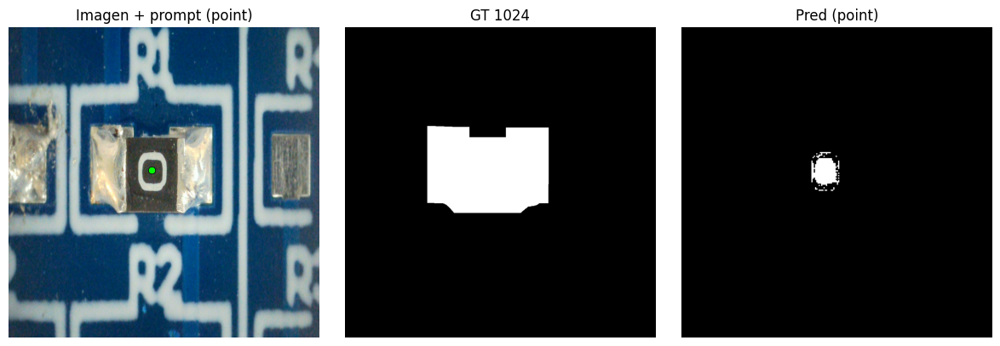

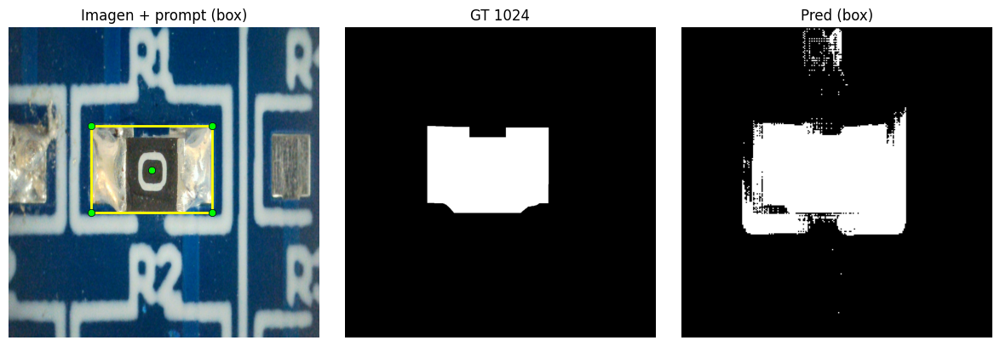

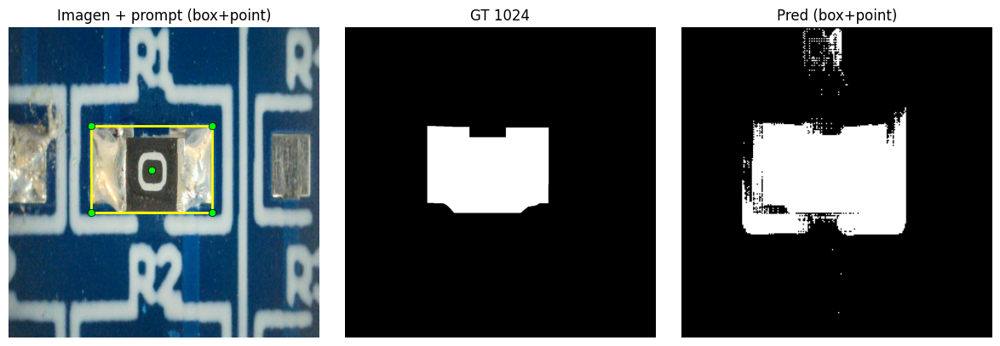

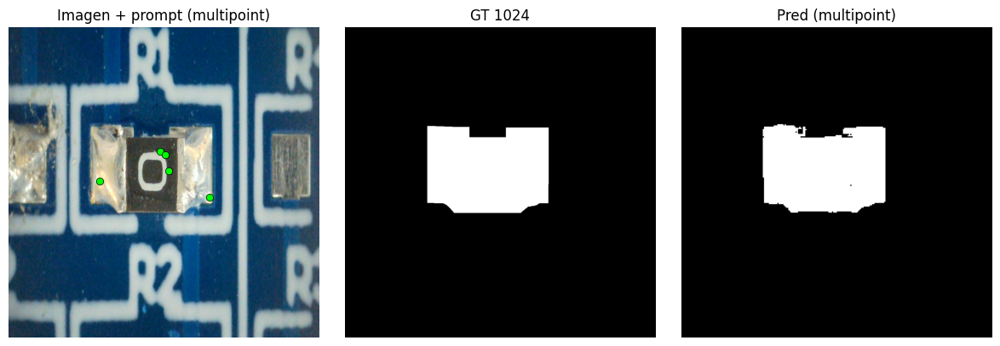

  0%|          | 1/428 [00:08<58:03,  8.16s/it]

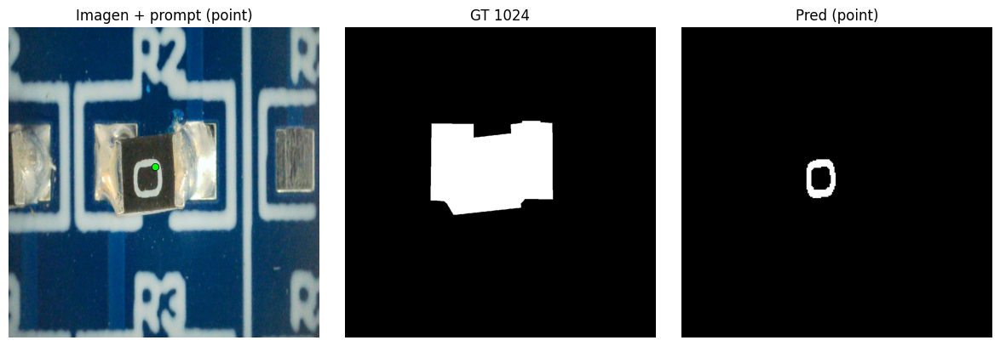

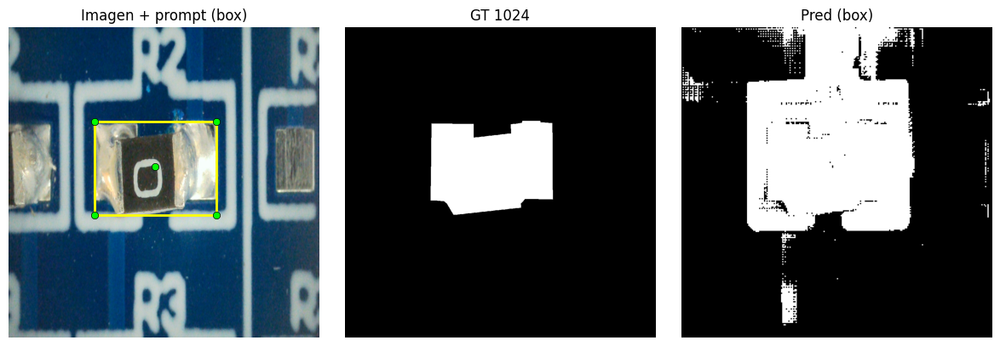

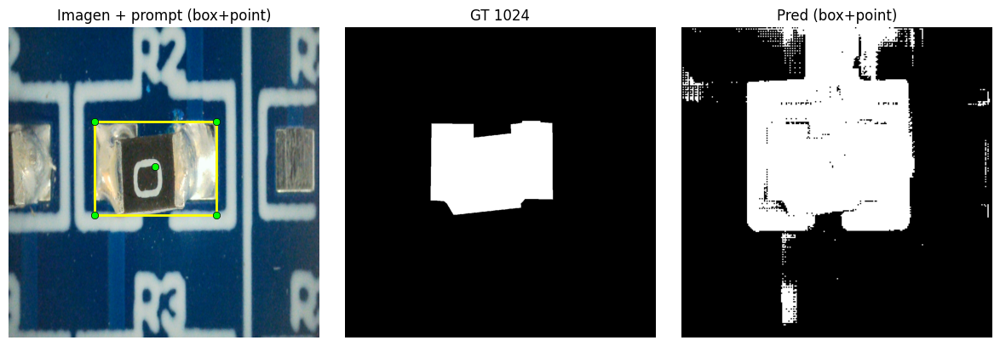

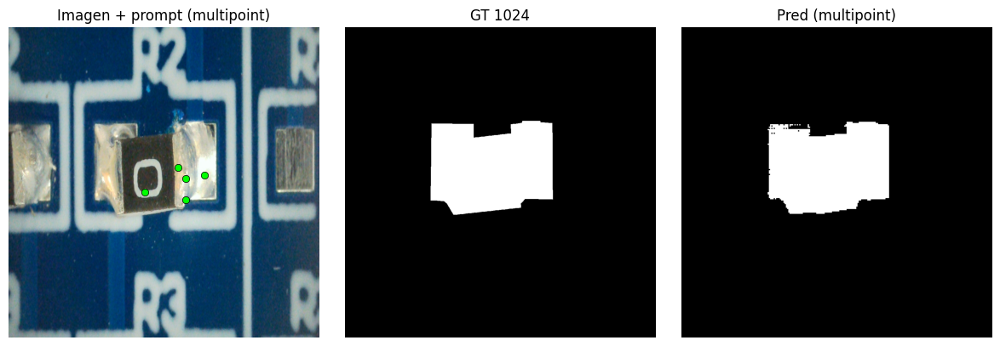

  0%|          | 2/428 [00:16<59:44,  8.41s/it]

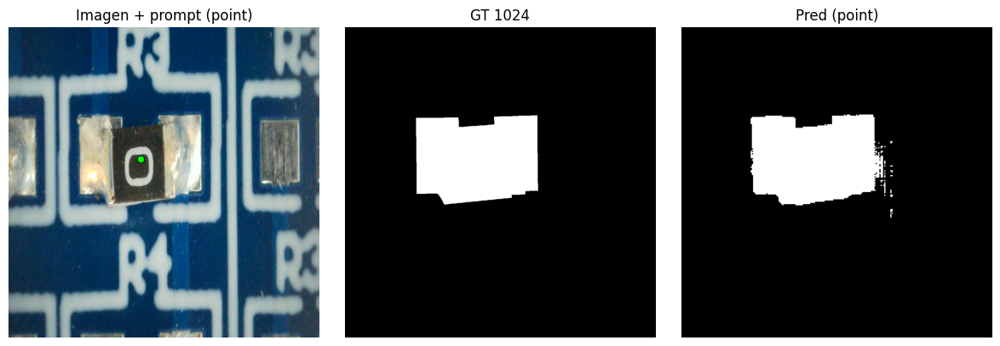

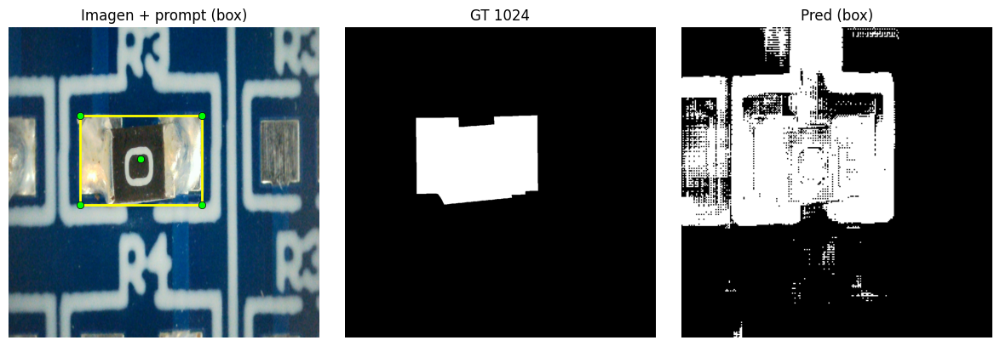

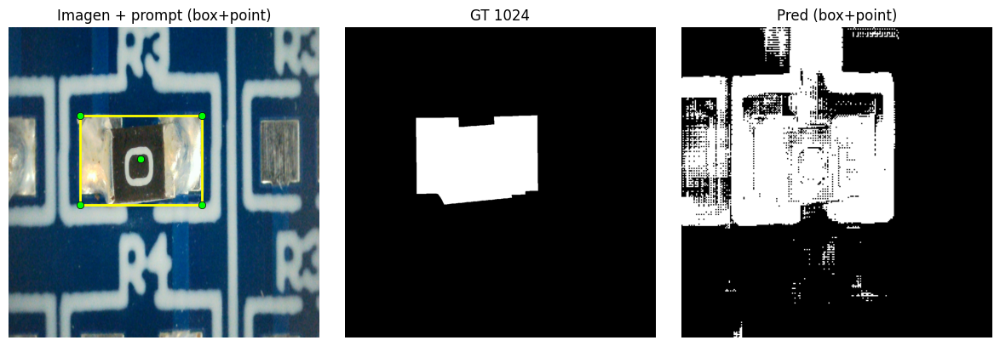

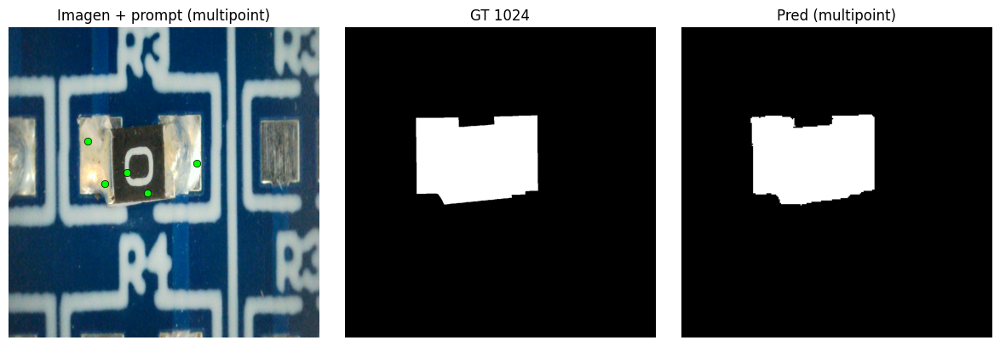

  1%|          | 3/428 [00:25<1:00:43,  8.57s/it]

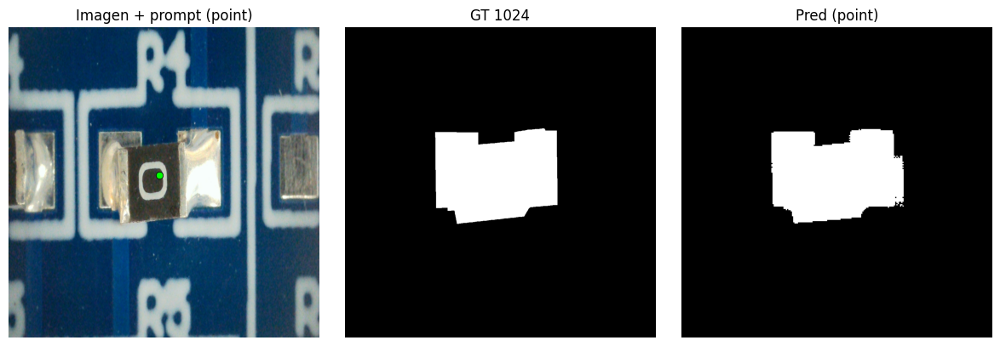

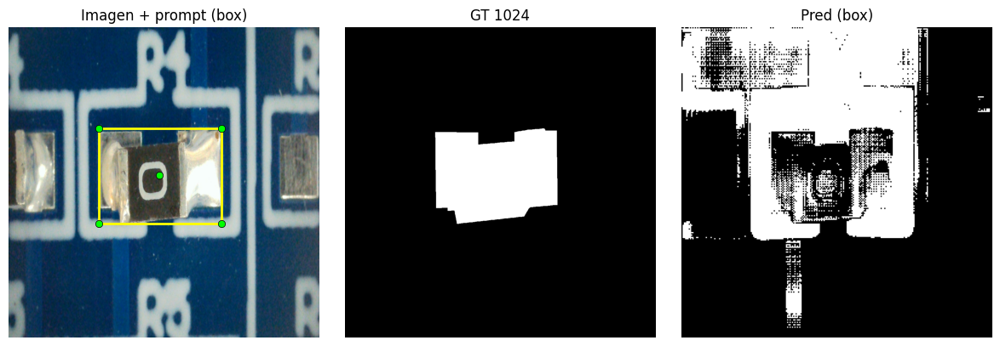

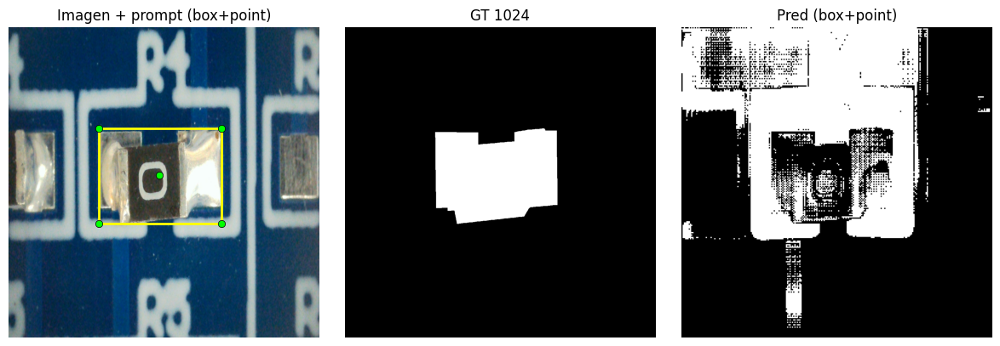

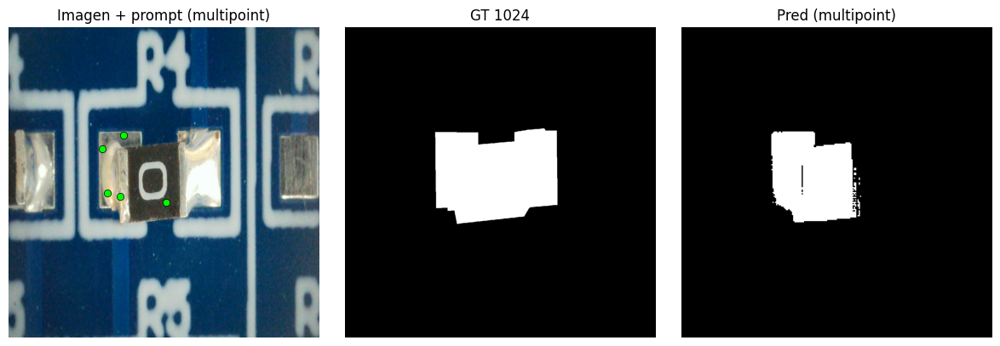

  1%|          | 4/428 [00:33<57:39,  8.16s/it]  

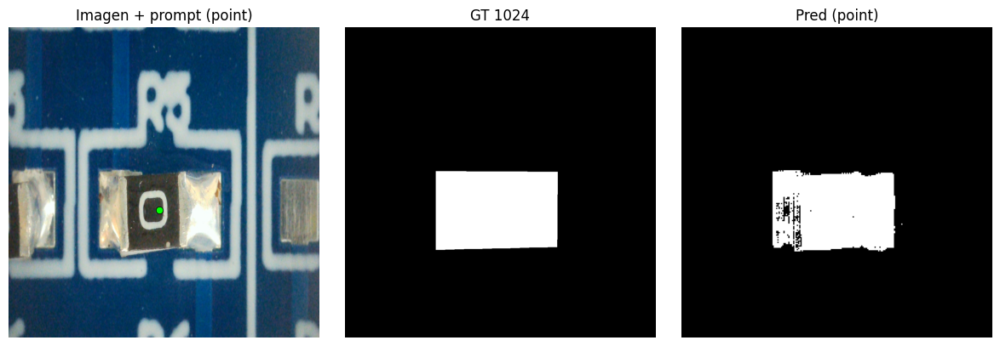

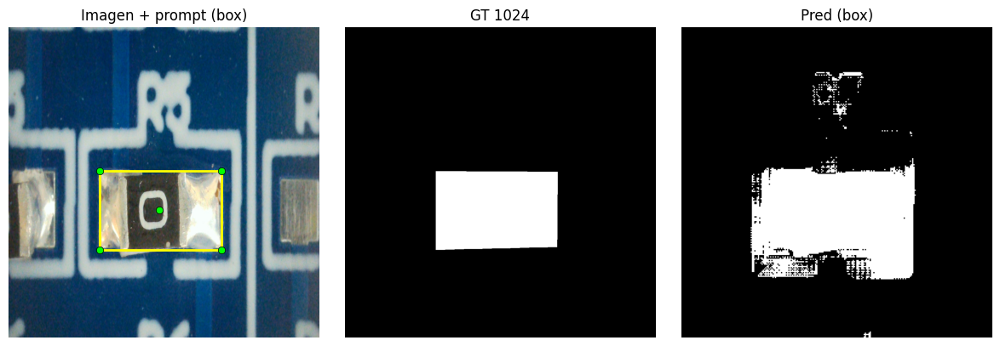

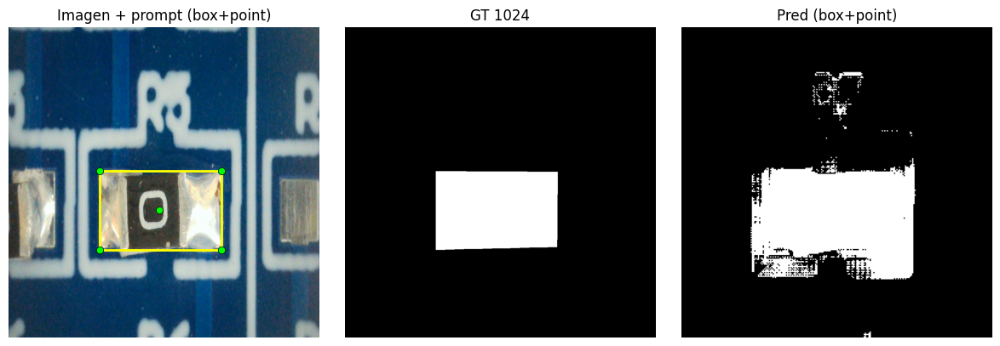

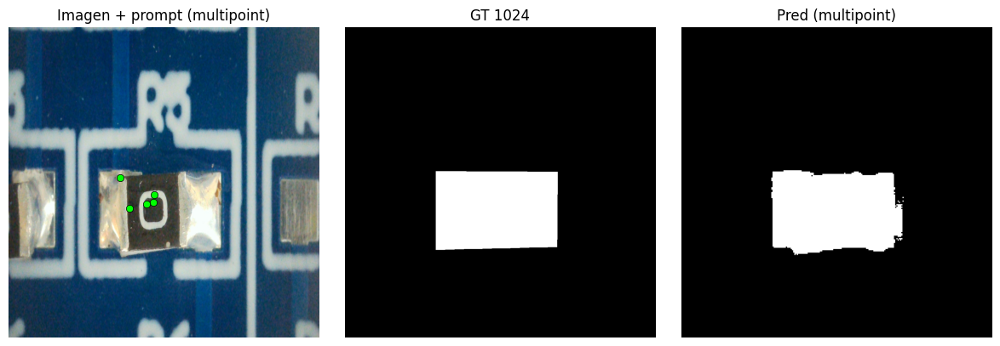

100%|██████████| 428/428 [10:29<00:00,  1.47s/it]

✅ Evaluación completada (NanoSAM ONNX).


In [ ]:
# Evaluación NanoSAM (ONNX) con prompts y métricas a 1024
from torch.utils.data import Dataset, DataLoader
from PIL import Image as PILImage
import os, time, cv2
import matplotlib.pyplot as plt
from matplotlib import patches
from tqdm import tqdm
import numpy as np

# Métricas en NumPy
def dice_coef_np(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=np.uint8).ravel()
    y_pred = np.asarray(y_pred, dtype=np.uint8).ravel()
    inter = np.sum((y_true == 1) & (y_pred == 1))
    return (2.0 * inter) / (np.sum(y_true) + np.sum(y_pred) + 1e-7)

def iou_np(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=np.uint8).ravel()
    y_pred = np.asarray(y_pred, dtype=np.uint8).ravel()
    inter = np.sum((y_true == 1) & (y_pred == 1))
    union = np.sum((y_true == 1) | (y_pred == 1)) + 1e-7
    return inter / union

def precision_np(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=np.uint8).ravel()
    y_pred = np.asarray(y_pred, dtype=np.uint8).ravel()
    tp = np.sum((y_true == 1) & (y_pred == 1))
    fp = np.sum((y_true == 0) & (y_pred == 1))
    return tp / (tp + fp + 1e-7)

def recall_np(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=np.uint8).ravel()
    y_pred = np.asarray(y_pred, dtype=np.uint8).ravel()
    tp = np.sum((y_true == 1) & (y_pred == 1))
    fn = np.sum((y_true == 1) & (y_pred == 0))
    return tp / (tp + fn + 1e-7)

# Dataset RAW (PIL)
class PCBDefectDatasetRaw(Dataset):
    def __init__(self, image_paths, mask_paths):
        assert len(image_paths) == len(mask_paths)
        self.image_paths = image_paths
        self.mask_paths = mask_paths
    def __len__(self): return len(self.image_paths)
    def __getitem__(self, idx):
        img = PILImage.open(self.image_paths[idx]).convert("RGB")
        msk = PILImage.open(self.mask_paths[idx]).convert("L")
        return img, msk, self.image_paths[idx]

# Helpers de decoder ONNX
TARGET = 1024
NORMALIZE_POINTS = False

def run_decoder_points(dec_sess, embeddings, pts_1024):
    """
    dec_sess: InferenceSession del decoder
    embeddings: (1,256,64,64) float32
    pts_1024: (N,2) en 1024x1024 (o [0,1] si NORMALIZE_POINTS=True)
    -> iou_predictions (1,4), low_res_masks (1,4,256,256)
    """
    if pts_1024.ndim == 1:
        pts_1024 = pts_1024[None, :]

    if NORMALIZE_POINTS:
        pts = pts_1024.astype(np.float32).copy()
        pts[:, 0] /= TARGET
        pts[:, 1] /= TARGET
    else:
        pts = pts_1024.astype(np.float32)

    feed = {
        "image_embeddings": embeddings.astype(np.float32),
        "point_coords": pts[None, ...].astype(np.float32),      # (1,N,2)
        "point_labels": np.ones((1, pts.shape[0]), np.float32), # (1,N) float32
        "mask_input": np.zeros((1,1,256,256), np.float32),
        "has_mask_input": np.array([0.0], np.float32),
    }

    out_names = [o.name for o in dec_sess.get_outputs()]
    outs = dec_sess.run(out_names, feed)
    od = {k:v for k,v in zip(out_names, outs)}

    iou = od.get("iou_predictions", None)
    low = od.get("low_res_masks", None)
    if iou is None:
        for k in od:
            if "iou" in k: iou = od[k]; break
    if low is None:
        for k in od:
            if "low_res" in k or "mask" in k: low = od[k]; break
    if iou is None or low is None:
        raise RuntimeError("No se encontraron salidas esperadas en el decoder.")
    return iou, low

def pick_and_upscale(low_res_masks, iou_predictions, orig_size, return_both=False):
    """
    low_res_masks: (1,4,256,256) logits
    iou_predictions: (1,4)
    -> (mask_1024, mask_orig) si return_both=True; si no, mask_orig
    (Binariza con umbral en logit 0 ≡ sigmoid(x)>0.5)
    """
    if low_res_masks.ndim == 4 and low_res_masks.shape[0] == 1:
        low_res_masks = low_res_masks[0]  # (4,256,256)

    best_idx = int(np.argmax(iou_predictions[0])) if iou_predictions.ndim == 2 else int(np.argmax(iou_predictions))
    logits = low_res_masks[best_idx]  # (256,256)

    # sin overflow:
    mask = (logits > 0).astype(np.uint8)

    mask_1024 = cv2.resize(mask, (TARGET, TARGET), interpolation=cv2.INTER_NEAREST)
    oh, ow = orig_size
    mask_orig = cv2.resize(mask_1024, (ow, oh), interpolation=cv2.INTER_NEAREST)

    return (mask_1024, mask_orig) if return_both else mask_orig

# Evaluación
prompt_types = ["point", "box", "box+point", "multipoint"]
results = {k: {"ious": [], "dices": [], "precs": [], "recs": [], "times": [], "vrams": [], "last_pred": None}
           for k in prompt_types}

rng = np.random.default_rng(0)

print("\n🚀 Evaluando NanoSAM (ONNX) con 4 tipos de prompt...\n")
save_vis = True
os.makedirs("/content/resultados_pred", exist_ok=True)

eval_loader = DataLoader(
    PCBDefectDatasetRaw(image_paths, mask_paths),
    batch_size=1,
    shuffle=False,
    num_workers=0,
    pin_memory=False,
    collate_fn=lambda x: x
)

for i, batch in enumerate(tqdm(eval_loader)):
    image_pil, mask_pil, path = batch[0]
    orig_w, orig_h = image_pil.size  # (W,H)

    # GT original -> coords
    gt_mask = (np.array(mask_pil) > 127)
    coords = np.argwhere(gt_mask)  # (y,x)
    if coords.size == 0:
        print(f"⚠️ Sin anotación en: {path}")
        continue

    # bbox + centro en original
    y_min, x_min = coords.min(axis=0)
    y_max, x_max = coords.max(axis=0)
    y_c, x_c = coords.mean(axis=0).astype(int)

    # Preprocesar a 1024 y obtener embeddings ONNX
    input_tensor, gt_1024 = preprocess_to_1024(image_pil, mask_pil)  # (1,3,1024,1024), (1024,1024)
    embeddings = encode_image_onnx(enc_sess, input_tensor)           # (1,256,64,64)
    y_true = gt_1024.flatten().astype(np.uint8)

    # Escalas (original -> 1024)
    scale_x = 1024.0 / float(orig_w)
    scale_y = 1024.0 / float(orig_h)

    for method in prompt_types:
        start = time.time()

        if method == "point":
            pts = np.array([[x_c * scale_x, y_c * scale_y]], dtype=np.float32)

        elif method == "box":
            # Aproximamos box con 4 esquinas + centro (5 puntos positivos)
            pts = np.array([
                [x_min * scale_x, y_min * scale_y],
                [x_max * scale_x, y_min * scale_y],
                [x_min * scale_x, y_max * scale_y],
                [x_max * scale_x, y_max * scale_y],
                [x_c   * scale_x, y_c   * scale_y],
            ], dtype=np.float32)

        elif method == "box+point":
            # Igual que box (ya incluye centro)
            pts = np.array([
                [x_min * scale_x, y_min * scale_y],
                [x_max * scale_x, y_min * scale_y],
                [x_min * scale_x, y_max * scale_y],
                [x_max * scale_x, y_max * scale_y],
                [x_c   * scale_x, y_c   * scale_y],
            ], dtype=np.float32)

        elif method == "multipoint":
            n_points = min(5, len(coords))
            sampled = coords[rng.choice(len(coords), size=n_points, replace=False)]
            # (x,y) en 1024
            pts = np.stack([sampled[:, 1] * scale_x, sampled[:, 0] * scale_y], axis=1).astype(np.float32)

        # Decoder ONNX con puntos -> 4 máscaras (baja res) + iou_pred
        iou_pred, lowres_masks = run_decoder_points(dec_sess, embeddings, pts)
        pred_mask_1024, pred_mask_orig = pick_and_upscale(
            lowres_masks, iou_pred, (orig_h, orig_w), return_both=True
        )
        elapsed = time.time() - start

        # Eval a 1024 para cuadrar con GT 1024
        y_pred = pred_mask_1024.flatten().astype(np.uint8)

        # Métricas (NumPy)
        results[method]["ious"].append(iou_np(y_true, y_pred))
        results[method]["dices"].append(dice_coef_np(y_true, y_pred))
        results[method]["precs"].append(precision_np(y_true, y_pred))
        results[method]["recs"].append(recall_np(y_true, y_pred))
        results[method]["times"].append(elapsed)
        results[method]["vrams"].append(np.nan)
        results[method]["last_pred"] = pred_mask_1024  # guardamos la de 1024

        #  Visualización: 1) imagen+prompt, 2) GT 1024, 3) máscara 1024
        if save_vis and i < 5:
            fig, axes = plt.subplots(1, 3, figsize=(12, 4))

            # 1) Imagen + prompt (a 1024)
            img_1024_vis = image_pil.resize((1024, 1024), PILImage.BILINEAR)
            axes[0].imshow(img_1024_vis)
            # Dibuja caja si aplica
            if method in ["box", "box+point"]:
                x1 = x_min * scale_x; y1 = y_min * scale_y
                x2 = x_max * scale_x; y2 = y_max * scale_y
                rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1,
                                         fill=False, linewidth=2, edgecolor='yellow')
                axes[0].add_patch(rect)
            # Dibuja puntos (positivos, en verde)
            axes[0].scatter(pts[:, 0], pts[:, 1], s=36, c='lime',
                            edgecolors='black', linewidths=0.5)
            axes[0].set_title(f"Imagen + prompt ({method})")
            axes[0].axis("off")

            # 2) GT 1024
            axes[1].imshow(gt_1024, cmap='gray')
            axes[1].set_title("GT 1024")
            axes[1].axis("off")

            # 3) Máscara segmentada 1024
            axes[2].imshow(pred_mask_1024, cmap='gray')
            axes[2].set_title(f"Pred ({method})")
            axes[2].axis("off")

            plt.tight_layout()
            outp = f"/content/resultados_pred/pred_{i}_{method}.png"
            plt.savefig(outp, dpi=150)
            plt.show()
            plt.close()

print("✅ Evaluación completada (NanoSAM ONNX).")




# Evaluación de NanoSAM-ONNX según el número de puntos proporcionados como entrada.


🔎 Barrido de puntos: K = [1, 2, 3, 5, 10] 



K=1:   0%|          | 0/428 [00:00<?, ?it/s]

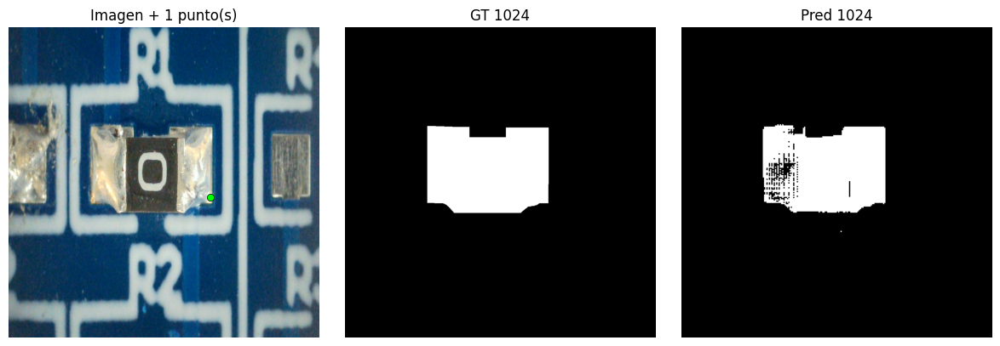

K=1:   0%|          | 1/428 [00:05<42:11,  5.93s/it]

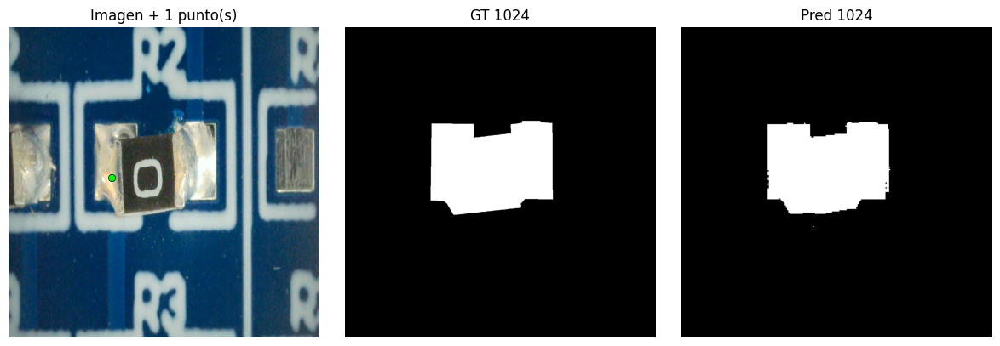

K=2:   0%|          | 0/428 [00:00<?, ?it/s]

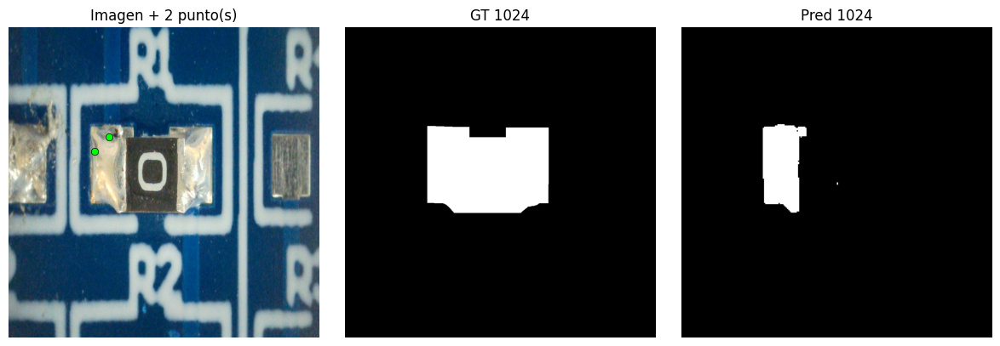

K=2:   0%|          | 1/428 [00:03<24:59,  3.51s/it]

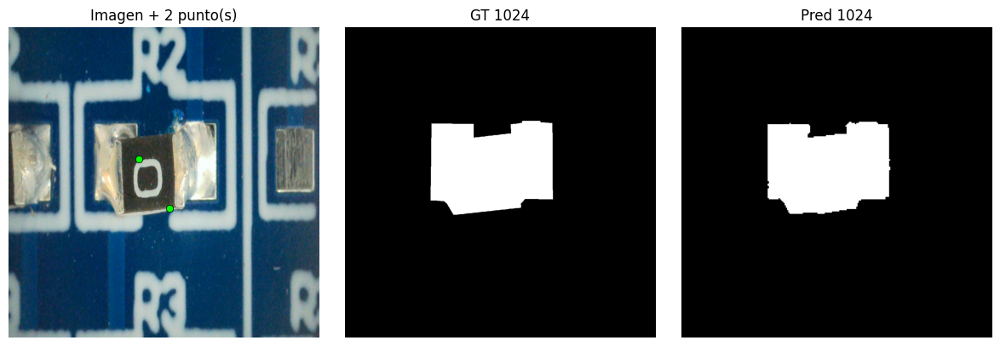

K=3:   0%|          | 0/428 [00:00<?, ?it/s]

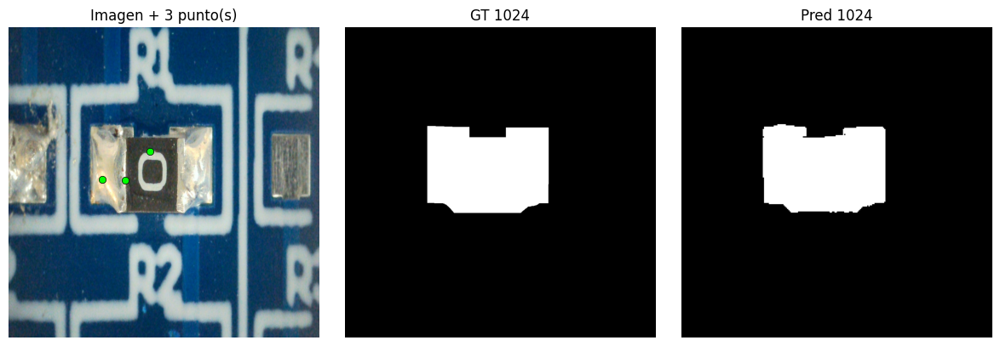

K=3:   0%|          | 1/428 [00:02<17:05,  2.40s/it]

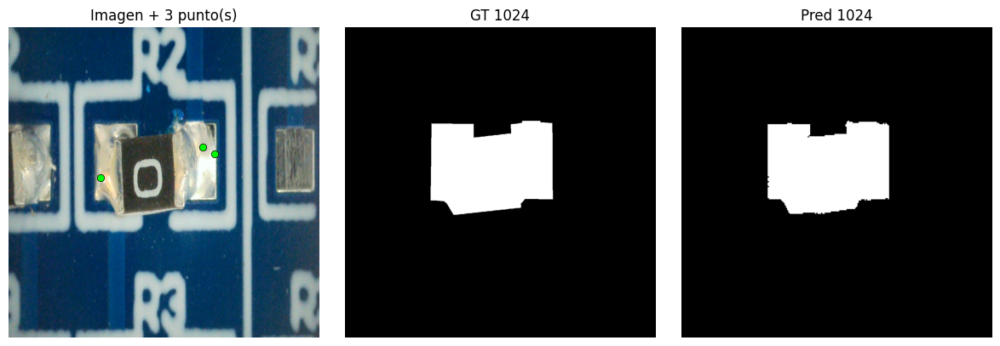

K=5:   0%|          | 0/428 [00:00<?, ?it/s]

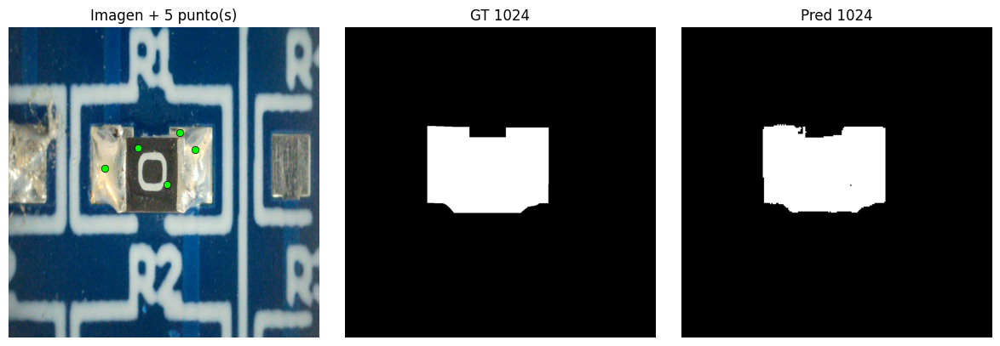

K=5:   0%|          | 1/428 [00:03<24:52,  3.50s/it]

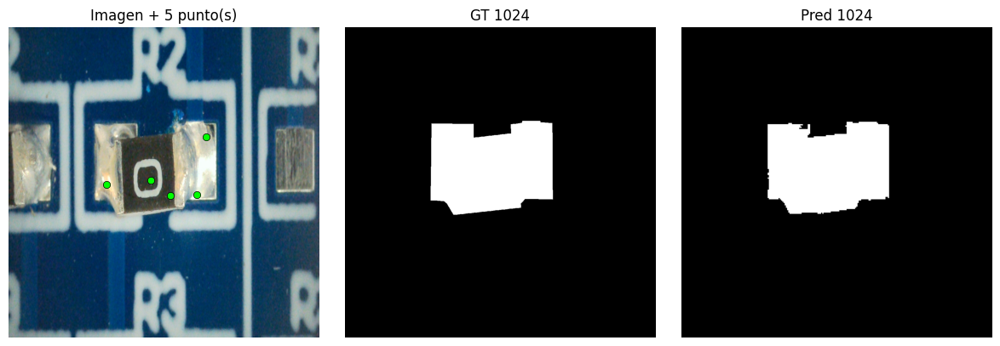

K=10:   0%|          | 0/428 [00:00<?, ?it/s]

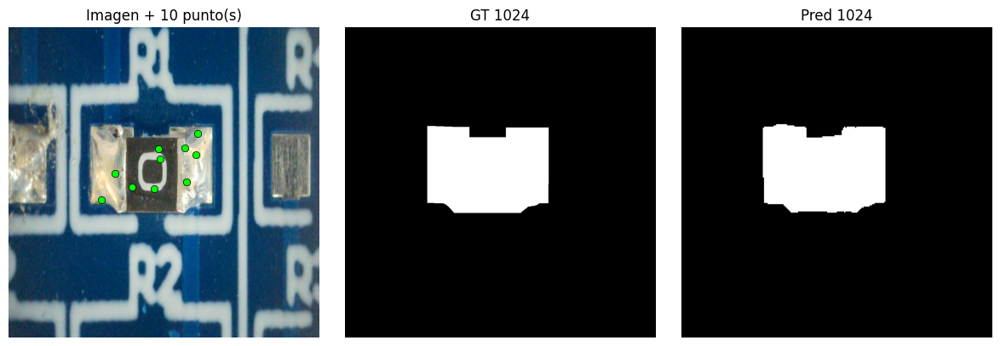

K=10:   0%|          | 1/428 [00:02<17:52,  2.51s/it]

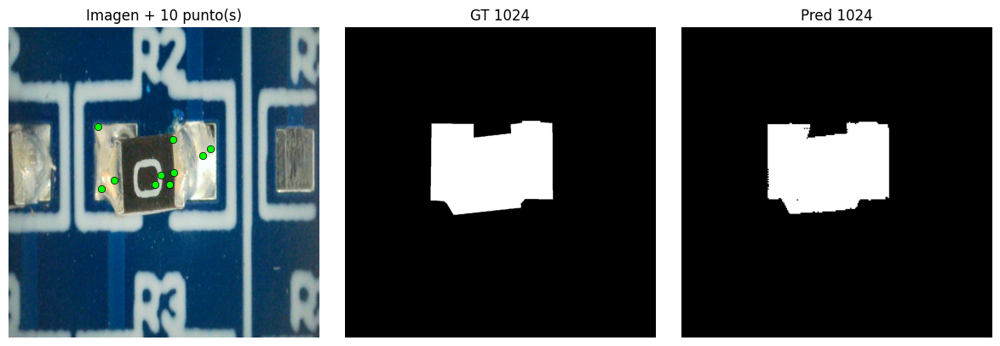

K=10: 100%|██████████| 428/428 [07:27<00:00,  1.05s/it]


📊 Resumen por número de puntos (media ± std):
 K_points   N  IoU_mean  IoU_std  Dice_mean  Dice_std  Prec_mean  Prec_std  Rec_mean  Rec_std  Time_mean_s  FPS_mean
        1 428    0.5132   0.2953     0.6293    0.2554     0.7566    0.2790    0.7199   0.3338       0.0946   10.5748
        2 428    0.5886   0.2757     0.7028    0.2226     0.7237    0.2861    0.8412   0.2473       0.0955   10.4748
        3 428    0.6434   0.2651     0.7502    0.2048     0.7453    0.2764    0.8777   0.1982       0.0954   10.4842
        5 428    0.6587   0.2511     0.7658    0.1890     0.7336    0.2761    0.9071   0.1463       0.0965   10.3634
       10 428    0.7043   0.2523     0.7992    0.1851     0.7372    0.2690    0.9540   0.0718       0.1000    9.9966

💾 CSV guardado en: /content/resultados_pred_k/resumen_por_k.csv


In [ ]:
# Barrido de número de puntos (K) para NanoSAM-ONNX
from torch.utils.data import Dataset, DataLoader
from PIL import Image as PILImage
import numpy as np, os, time, cv2
import matplotlib.pyplot as plt
from matplotlib import patches
from tqdm import tqdm

# Configuración del barrido
K_LIST = [1, 2, 3, 5, 10]   # números de puntos positivos a evaluar
MAX_VIS_PER_K = 2           # cuántos ejemplos mostrar/guardar por cada K
SAVE_DIR = "/content/resultados_pred_k"
os.makedirs(SAVE_DIR, exist_ok=True)

# Dataset/DataLoader (PIL, sin transforms)
class PCBDefectDatasetRaw(Dataset):
    def __init__(self, image_paths, mask_paths):
        assert len(image_paths) == len(mask_paths)
        self.image_paths = image_paths
        self.mask_paths = mask_paths
    def __len__(self): return len(self.image_paths)
    def __getitem__(self, idx):
        img = PILImage.open(self.image_paths[idx]).convert("RGB")
        msk = PILImage.open(self.mask_paths[idx]).convert("L")
        return img, msk, self.image_paths[idx]

loader = DataLoader(
    PCBDefectDatasetRaw(image_paths, mask_paths),
    batch_size=1, shuffle=False, num_workers=0, pin_memory=False, collate_fn=lambda x: x
)

# Métricas NumPy
def dice_coef_np(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=np.uint8).ravel()
    y_pred = np.asarray(y_pred, dtype=np.uint8).ravel()
    inter = np.sum((y_true == 1) & (y_pred == 1))
    return (2.0 * inter) / (np.sum(y_true) + np.sum(y_pred) + 1e-7)

def iou_np(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=np.uint8).ravel()
    y_pred = np.asarray(y_pred, dtype=np.uint8).ravel()
    inter = np.sum((y_true == 1) & (y_pred == 1))
    union = np.sum((y_true == 1) | (y_pred == 1)) + 1e-7
    return inter / union

def precision_np(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=np.uint8).ravel()
    y_pred = np.asarray(y_pred, dtype=np.uint8).ravel()
    tp = np.sum((y_true == 1) & (y_pred == 1))
    fp = np.sum((y_true == 0) & (y_pred == 1))
    return tp / (tp + fp + 1e-7)

def recall_np(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=np.uint8).ravel()
    y_pred = np.asarray(y_pred, dtype=np.uint8).ravel()
    tp = np.sum((y_true == 1) & (y_pred == 1))
    fn = np.sum((y_true == 1) & (y_pred == 0))
    return tp / (tp + fn + 1e-7)

# Resultados por K
sweep_results = {
    k: {"ious": [], "dices": [], "precs": [], "recs": [], "times": []}
    for k in K_LIST
}

rng = np.random.default_rng(0)
print("\n🔎 Barrido de puntos: K =", K_LIST, "\n")

for k in K_LIST:
    vis_count = 0
    pbar = tqdm(loader, desc=f"K={k}")
    for batch in pbar:
        image_pil, mask_pil, path = batch[0]
        orig_w, orig_h = image_pil.size

        # GT original y coords positivas
        gt_mask_orig = (np.array(mask_pil) > 127)
        pos_coords = np.argwhere(gt_mask_orig)  # (y,x)
        if pos_coords.size == 0:
            continue

        # Preprocess + embeddings
        input_tensor, gt_1024 = preprocess_to_1024(image_pil, mask_pil)   # (1,3,1024,1024), (1024,1024)
        embeddings = encode_image_onnx(enc_sess, input_tensor)            # (1,256,64,64)
        y_true = gt_1024.flatten().astype(np.uint8)

        # Escalas original->1024
        scale_x = 1024.0 / float(orig_w)
        scale_y = 1024.0 / float(orig_h)

        # Muestrea K puntos positivos
        n_pos = min(k, len(pos_coords))
        sampled = pos_coords[rng.choice(len(pos_coords), size=n_pos, replace=False)]
        # -> (x,y) en 1024
        pts = np.stack([sampled[:, 1] * scale_x, sampled[:, 0] * scale_y], axis=1).astype(np.float32)

        # Decoder → máscaras e IoU predicho
        t0 = time.time()
        iou_pred, lowres_masks = run_decoder_points(dec_sess, embeddings, pts)
        pred_mask_1024, pred_mask_orig = pick_and_upscale(lowres_masks, iou_pred, (orig_h, orig_w), return_both=True)
        elapsed = time.time() - t0

        # Métricas a 1024
        y_pred = pred_mask_1024.flatten().astype(np.uint8)
        sweep_results[k]["ious"].append(iou_np(y_true, y_pred))
        sweep_results[k]["dices"].append(dice_coef_np(y_true, y_pred))
        sweep_results[k]["precs"].append(precision_np(y_true, y_pred))
        sweep_results[k]["recs"].append(recall_np(y_true, y_pred))
        sweep_results[k]["times"].append(elapsed)

        # Visualización
        if vis_count < MAX_VIS_PER_K:
            fig, axes = plt.subplots(1, 3, figsize=(12, 4))

            # 1) Imagen + puntos (a 1024)
            img_1024_vis = image_pil.resize((1024, 1024), PILImage.BILINEAR)
            axes[0].imshow(img_1024_vis)
            axes[0].scatter(pts[:, 0], pts[:, 1], s=36, c='lime', edgecolors='black', linewidths=0.5)
            axes[0].set_title(f"Imagen + {k} punto(s)")
            axes[0].axis("off")

            # 2) GT 1024
            axes[1].imshow(gt_1024, cmap='gray')
            axes[1].set_title("GT 1024")
            axes[1].axis("off")

            # 3) Pred 1024
            axes[2].imshow(pred_mask_1024, cmap='gray')
            axes[2].set_title("Pred 1024")
            axes[2].axis("off")

            plt.tight_layout()
            fname = os.path.join(SAVE_DIR, f"vis_k{k}_{vis_count}.png")
            plt.savefig(fname, dpi=150)
            plt.show()
            plt.close()
            vis_count += 1

# Resumen final por K
import pandas as pd

def mean_std(arr):
    arr = np.asarray(arr, dtype=np.float64)
    return float(np.nanmean(arr)), float(np.nanstd(arr))

rows = []
for k in K_LIST:
    r = sweep_results[k]
    iou_m,iou_s   = mean_std(r["ious"])
    dice_m,dice_s = mean_std(r["dices"])
    pr_m,pr_s     = mean_std(r["precs"])
    rc_m,rc_s     = mean_std(r["recs"])
    t_m,t_s       = mean_std(r["times"])
    fps_m = (1.0/t_m) if t_m>0 else np.nan
    rows.append({"K_points":k,"N":len(r["ious"]),
                 "IoU_mean":iou_m,"IoU_std":iou_s,
                 "Dice_mean":dice_m,"Dice_std":dice_s,
                 "Prec_mean":pr_m,"Prec_std":pr_s,
                 "Rec_mean":rc_m,"Rec_std":rc_s,
                 "Time_mean_s":t_m,"FPS_mean":fps_m})

df_k = pd.DataFrame(rows).sort_values("K_points").reset_index(drop=True)
print("\n📊 Resumen por número de puntos (media ± std):")
print(df_k.round(4).to_string(index=False))

csv_k = os.path.join(SAVE_DIR, "resumen_por_k.csv")
df_k.to_csv(csv_k, index=False)
print("\n💾 CSV guardado en:", csv_k)


# Resultados de NanoSAM-ONNX con cuatro modalidades de prompt (point, box, box+point, multipoint).

In [ ]:
import numpy as np, pandas as pd, os

def mean_std(arr):
    arr = np.asarray(arr, dtype=np.float64)
    return float(np.nanmean(arr)), float(np.nanstd(arr))

rows = []
for method in ["point","box","box+point","multipoint"]:
    r = results[method]
    iou_m,iou_s   = mean_std(r["ious"])
    dice_m,dice_s = mean_std(r["dices"])
    pr_m,pr_s     = mean_std(r["precs"])
    rc_m,rc_s     = mean_std(r["recs"])
    t_m,t_s       = mean_std(r["times"])
    fps_m = (1.0/t_m) if t_m>0 else np.nan
    rows.append({"method":method.upper(),"N":len(r["ious"]),
                 "IoU_mean":iou_m,"IoU_std":iou_s,
                 "Dice_mean":dice_m,"Dice_std":dice_s,
                 "Prec_mean":pr_m,"Prec_std":pr_s,
                 "Rec_mean":rc_m,"Rec_std":rc_s,
                 "Time_mean_s":t_m,"FPS_mean":fps_m})

df = pd.DataFrame(rows)
print(df.round(4).to_string(index=False))

os.makedirs("/content/resultados_pred", exist_ok=True)
csv_path = "/content/resultados_pred/resumen_nanosam.csv"
df.to_csv(csv_path, index=False)
print("CSV guardado en:", csv_path)


    method   N  IoU_mean  IoU_std  Dice_mean  Dice_std  Prec_mean  Prec_std  Rec_mean  Rec_std  Time_mean_s  FPS_mean
     POINT 428    0.2912   0.3193     0.3671    0.3456     0.6132    0.4277    0.4142   0.4254       0.0965   10.3670
       BOX 428    0.2562   0.1701     0.3804    0.2058     0.2578    0.1710    0.9177   0.2373       0.0976   10.2413
 BOX+POINT 428    0.2562   0.1701     0.3804    0.2058     0.2578    0.1710    0.9177   0.2373       0.0980   10.2040
MULTIPOINT 428    0.6689   0.2568     0.7721    0.1927     0.7318    0.2757    0.9186   0.1378       0.0980   10.2047
CSV guardado en: /content/resultados_pred/resumen_nanosam.csv


In [ ]:
# Resumen de métricas por método (media ± std) y guardado a CSV
import numpy as np
import pandas as pd
import os

def mean_std(arr):
    arr = np.asarray(arr, dtype=np.float64)
    return float(np.nanmean(arr)), float(np.nanstd(arr))

rows = []
for method in prompt_types:
    r = results[method]
    iou_m,  iou_s  = mean_std(r["ious"])
    dice_m, dice_s = mean_std(r["dices"])
    pr_m,   pr_s   = mean_std(r["precs"])
    rc_m,   rc_s   = mean_std(r["recs"])
    t_m,    t_s    = mean_std(r["times"])
    # FPS medio aproximado como 1 / tiempo_medio
    fps_m = (1.0 / t_m) if t_m > 0 else np.nan
    vram_m, vram_s = mean_std(r["vrams"]) if len(r["vrams"]) else (np.nan, np.nan)
    n = len(r["ious"])

    rows.append({
        "method": method.upper(),
        "N": n,
        "IoU_mean": iou_m,  "IoU_std": iou_s,
        "Dice_mean": dice_m,"Dice_std": dice_s,
        "Prec_mean": pr_m,  "Prec_std": pr_s,
        "Rec_mean": rc_m,   "Rec_std": rc_s,
        "Time_mean_s": t_m, "Time_std_s": t_s,
        "FPS_mean": fps_m,
        "VRAM_mean_MB": vram_m, "VRAM_std_MB": vram_s
    })

df = pd.DataFrame(rows).sort_values("method").reset_index(drop=True)

display_cols = ["method","N",
                "IoU_mean","IoU_std",
                "Dice_mean","Dice_std",
                "Prec_mean","Prec_std",
                "Rec_mean","Rec_std",
                "Time_mean_s","FPS_mean"]
print("📊 Resumen (medias ± std):")
print(df[display_cols].round({
    "IoU_mean":4,"IoU_std":4,"Dice_mean":4,"Dice_std":4,
    "Prec_mean":4,"Prec_std":4,"Rec_mean":4,"Rec_std":4,
    "Time_mean_s":4,"FPS_mean":2
}).to_string(index=False))

# Guardar a CSV
os.makedirs("/content/resultados_pred", exist_ok=True)
csv_path = "/content/resultados_pred/resumen_nanosam.csv"
df.to_csv(csv_path, index=False)
print(f"\n💾 Guardado en: {csv_path}")


📊 Resumen (medias ± std):
    method   N  IoU_mean  IoU_std  Dice_mean  Dice_std  Prec_mean  Prec_std  Rec_mean  Rec_std  Time_mean_s  FPS_mean
       BOX 428    0.2562   0.1701     0.3804    0.2058     0.2578    0.1710    0.9177   0.2373       0.0997     10.03
 BOX+POINT 428    0.2562   0.1701     0.3804    0.2058     0.2578    0.1710    0.9177   0.2373       0.0993     10.07
MULTIPOINT 428    0.6689   0.2568     0.7721    0.1927     0.7318    0.2757    0.9186   0.1378       0.0991     10.09
     POINT 428    0.2912   0.3193     0.3671    0.3456     0.6132    0.4277    0.4142   0.4254       0.0966     10.36

💾 Guardado en: /content/resultados_pred/resumen_nanosam.csv


/tmp/ipython-input-1304203619.py:8: RuntimeWarning: Mean of empty slice
  return float(np.nanmean(arr)), float(np.nanstd(arr))
/usr/local/lib/python3.11/dist-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
